In [1]:
from collections import OrderedDict

import torch

from lucent.optvis import render, param, transform, objectives, objectives_util
from lucent.modelzoo import inceptionv1
from lucent.modelzoo.util import get_model_layers

from lucent.misc.io.showing import animate_sequence

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = inceptionv1(pretrained=True)
_ = model.to(device).eval()

Downloading: "https://github.com/ProGamerGov/pytorch-old-tensorflow-models/raw/master/inception5h.pth" to /home/pmin/.cache/torch/hub/checkpoints/inception5h.pth


  0%|          | 0.00/27.0M [00:00<?, ?B/s]

In [3]:
@objectives.wrap_objective()
def localgroup_squared(layer, weight=None, wx=1, wy=1, batch=None):
  """ Linearly weighted channel activation around some spot as objective
  weight: a torch Tensor vector same length as channel. """
  @objectives.handle_batch(batch)
  def inner(model):
    layer_t = model(layer)
    
    x = (layer_t.shape[3] + 1 - wx) // 2
    y = (layer_t.shape[2] + 1 - wy) // 2
    if weight is None:
      return -((layer_t[:, :, y:y + wy, x:x + wx]) ** 2).mean()
    else:
      return -((layer_t[:, :, y:y + wy, x:x + wx] * weight.view(1, -1, 1, 1)) ** 2).mean()
  return inner

Warm up - find the best stimulus for a single layer from InceptionV1.

100%|██████████| 128/128 [00:04<00:00, 27.73it/s]



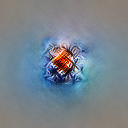

In [8]:
import numpy as np
batch_param_f = lambda: param.image(128, batch=1)

weight = torch.tensor(1.0 * (np.random.rand(256) < .1), device=device)
obj = localgroup_squared("mixed3a", wx=1, wy=1, weight=weight) + objectives.blur_input_each_step()

result = render.render_vis(model, obj, batch_param_f, show_inline=True, thresholds=(128,))

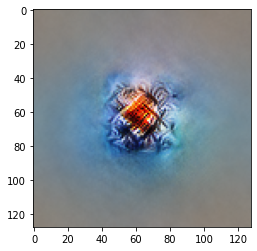

In [9]:
import matplotlib.pyplot as plt
plt.imshow(result[0][0, :, :, :])

We've got some very cool eye-of-Sauron type patterns if we optimize for activation in mixed3a. Let's look at what happens if optimize for a delta in optimization instead.

In [10]:
import torch.nn.functional as F

@objectives.wrap_objective()
def localgroup_squared_delta(layer, div_layer=None, w=None, wx=1, wy=1, subsel=None, diversity=0):
  """ Linearly weighted channel activation around some spot as objective
  weight: a torch Tensor vector same length as channel. """
  def inner(model):
    div = 0
    if diversity != 0:
      layer_t = model(layer)
      h1 = int(layer_t.shape[0] // 2)
      x = (layer_t.shape[3] + 1 - wx) // 2
      y = (layer_t.shape[2] + 1 - wy) // 2

      if subsel is not None:
        layer_ = layer_t[:h1, subsel, y:y + wy, x:x + wx]
      else:
        layer_ = layer_t[:h1, :, y:y + wy, x:x + wx]
      batch, channels, _, _ = layer_.shape
      flattened = layer_.reshape(batch, channels, -1)
      grams = torch.matmul(flattened, torch.transpose(flattened, 1, 2))
      grams = F.normalize(grams, p=2, dim=(1, 2))
      div = -diversity * sum([ sum([ (grams[i]*grams[j]).sum()
              for j in range(batch) if j != i])
              for i in range(batch)]) / batch

      if subsel is not None:
        layer_ = layer_t[h1:, subsel, y:y + wy, x:x + wx]
      else:
        layer_ = layer_t[h1:, :, y:y + wy, x:x + wx]
      
      batch, channels, _, _ = layer_.shape
      flattened = layer_.reshape(batch, channels, -1)
      grams = torch.matmul(flattened, torch.transpose(flattened, 1, 2))
      grams = F.normalize(grams, p=2, dim=(1, 2))
      div += -diversity * sum([ sum([ (grams[i]*grams[j]).sum()
              for j in range(batch) if j != i])
              for i in range(batch)]) / batch

    layer_t = model(layer)
    
    x = (layer_t.shape[3] + 1 - wx) // 2
    y = (layer_t.shape[2] + 1 - wy) // 2
        
    if subsel is None:
      return -((layer_t[:h1, :, y:y + wy, x:x + wx].mean(0) - layer_t[h1:, :, y:y + wy, x:x + wx].mean(0)) ** 2).mean() + div
    else:
      return -(((layer_t[:h1, subsel, y:y + wy, x:x + wx].mean(0) - layer_t[h1:, subsel, y:y + wy, x:x + wx].mean(0)) ** 2)).mean() + div
  return inner


100%|██████████| 512/512 [00:21<00:00, 24.00it/s]



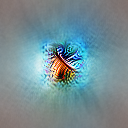
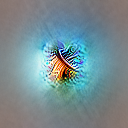
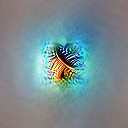
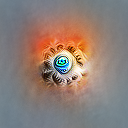
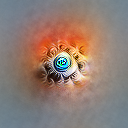
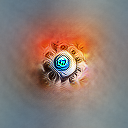

[[ 1.          0.74232901  0.68261568 -0.45481149 -0.52167454 -0.49531469]
 [ 0.74232901  1.          0.7121077  -0.46089883 -0.52685987 -0.53169944]
 [ 0.68261568  0.7121077   1.         -0.49127827 -0.54371437 -0.54009718]
 [-0.45481149 -0.46089883 -0.49127827  1.          0.71594221  0.69280676]
 [-0.52167454 -0.52685987 -0.54371437  0.71594221  1.          0.74462131]
 [-0.49531469 -0.53169944 -0.54009718  0.69280676  0.74462131  1.        ]]


In [11]:
batch_param_f = lambda: param.image(128, batch=6, fft=True)

obj = localgroup_squared_delta("mixed3a", 'conv2d1_pre_relu_conv', wx=1, wy=1, diversity=3e3)# + 1e9 * objectives.diversity("input")

result = render.render_vis(model, obj, batch_param_f, show_inline=True, thresholds=(512,))
print(np.corrcoef(result[0].reshape((result[0].shape[0], -1))))

The anti-stimulus kind of looks like a polar grating (if you squint enough). Let's do the *real thing* on VGG19, which has the highest BrainScore thus far.

In [12]:
from torchvision.models import vgg19

model = vgg19(pretrained=True).to(device).eval()

In [13]:
import io
import IPython
import PIL
from PIL import Image

from binascii import b2a_base64
import base64

def encode_result(results):
  the_str = "<div style='display:flex'>"
  for i in range(results.shape[0]):
    output = io.BytesIO()
    
    Image.fromarray((results[i, :, :, :] * 255).astype(np.uint8)).save(output, format="png")
    image_as_string = output.getvalue()
    b64_str = base64.b64encode(image_as_string).decode("utf-8")
    if i == 0:
      title = 'Class A samples'
    elif i == 3:
      title = 'Class B samples'
    else:
      title = '&nbsp;'
    the_str += f"<div style='margin-right: 10px'><div>{title}</div><img src='data:image/png;base64,{b64_str}' /></div>"

  the_str += "</div>"
  return the_str

In [14]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

  9%|▉         | 3/32 [00:00<00:01, 21.96it/s]

features_13


100%|██████████| 32/32 [00:01<00:00, 20.77it/s]



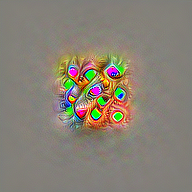
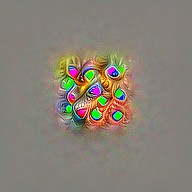
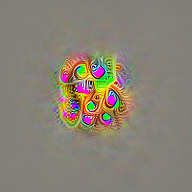
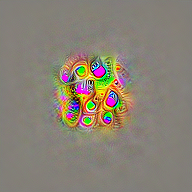

100%|██████████| 32/32 [00:01<00:00, 20.62it/s]



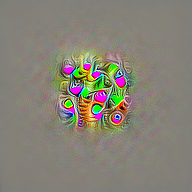
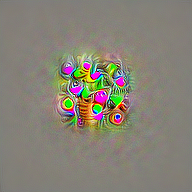
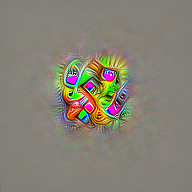
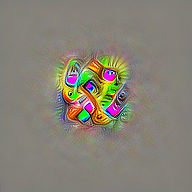

100%|██████████| 32/32 [00:01<00:00, 20.28it/s]



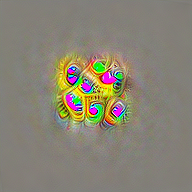
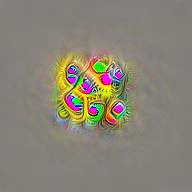
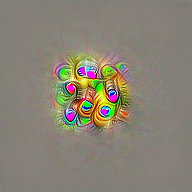
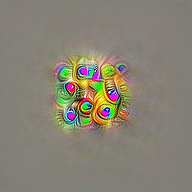

  9%|▉         | 3/32 [00:00<00:01, 22.62it/s]

features_15


100%|██████████| 32/32 [00:01<00:00, 20.29it/s]



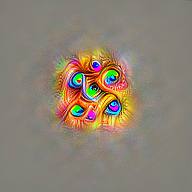
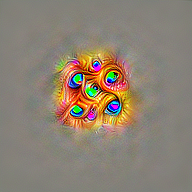
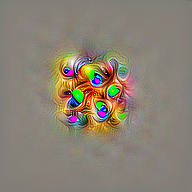
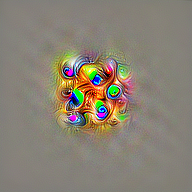

100%|██████████| 32/32 [00:01<00:00, 19.82it/s]



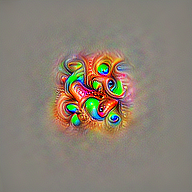
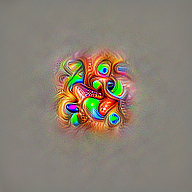
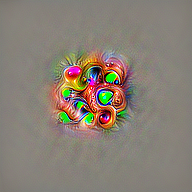
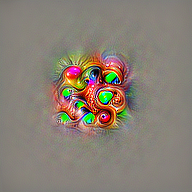

100%|██████████| 32/32 [00:01<00:00, 19.94it/s]



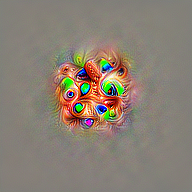
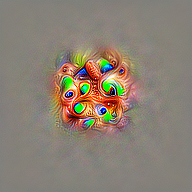
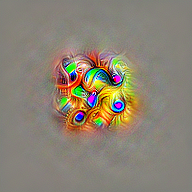
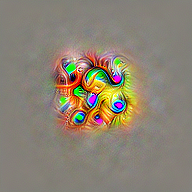

  5%|▍         | 3/64 [00:00<00:02, 21.33it/s]

features_17


100%|██████████| 64/64 [00:03<00:00, 18.94it/s]



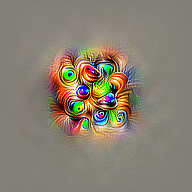
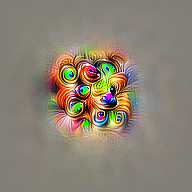
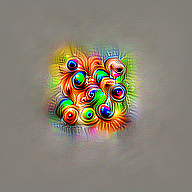
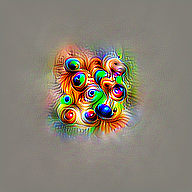

100%|██████████| 64/64 [00:03<00:00, 19.16it/s]



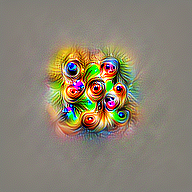
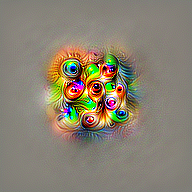
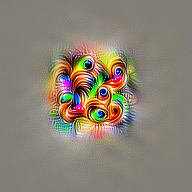
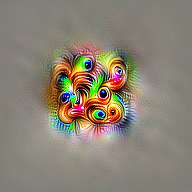

100%|██████████| 64/64 [00:03<00:00, 19.17it/s]



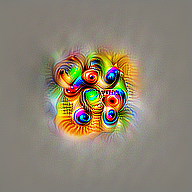
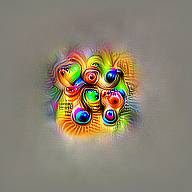
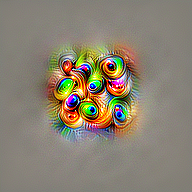
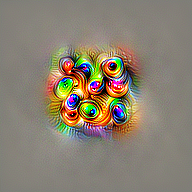

  5%|▍         | 3/64 [00:00<00:02, 20.72it/s]

features_20


100%|██████████| 64/64 [00:03<00:00, 18.70it/s]



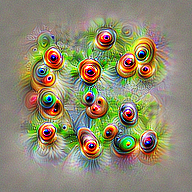
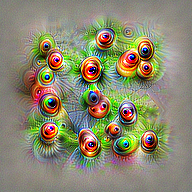
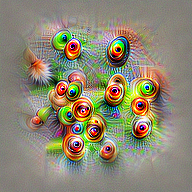
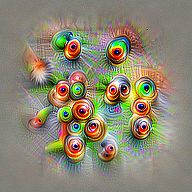

100%|██████████| 64/64 [00:03<00:00, 18.88it/s]



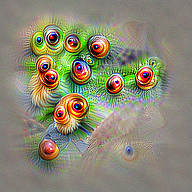
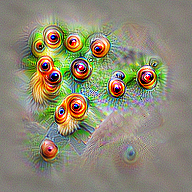
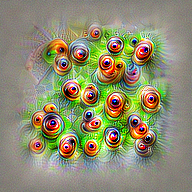
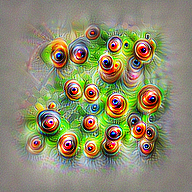

100%|██████████| 64/64 [00:03<00:00, 18.75it/s]



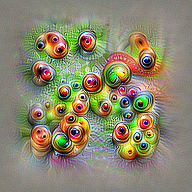
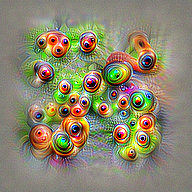
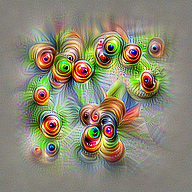
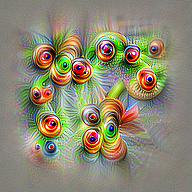

  5%|▍         | 3/64 [00:00<00:03, 18.88it/s]

features_22


100%|██████████| 64/64 [00:03<00:00, 17.76it/s]



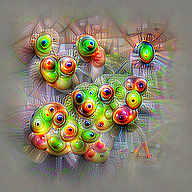
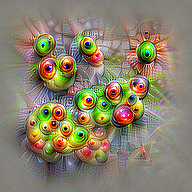
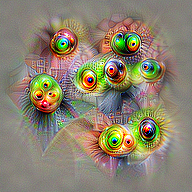
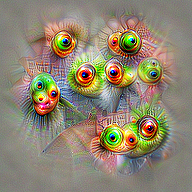

100%|██████████| 64/64 [00:03<00:00, 17.84it/s]



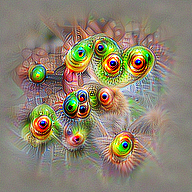
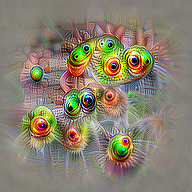
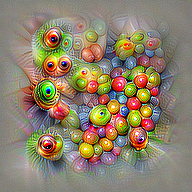
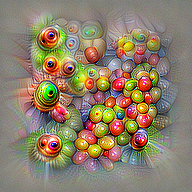

100%|██████████| 64/64 [00:03<00:00, 17.70it/s]



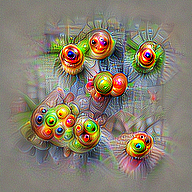
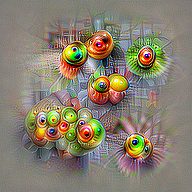
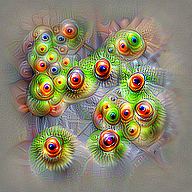
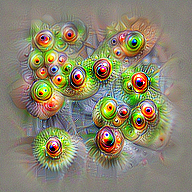

  5%|▍         | 3/64 [00:00<00:03, 19.72it/s]

features_24


100%|██████████| 64/64 [00:03<00:00, 17.63it/s]



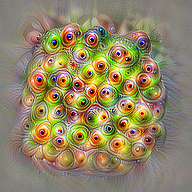
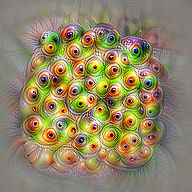
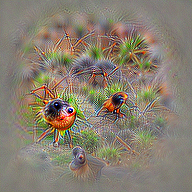
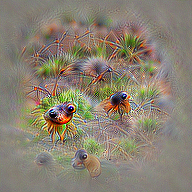

100%|██████████| 64/64 [00:03<00:00, 17.23it/s]



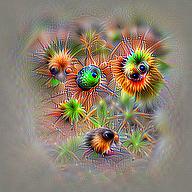
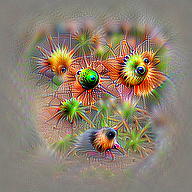
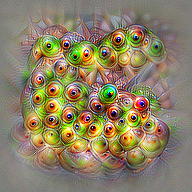
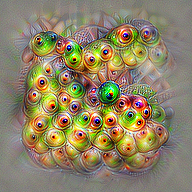

100%|██████████| 64/64 [00:03<00:00, 17.40it/s]



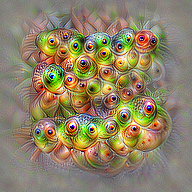
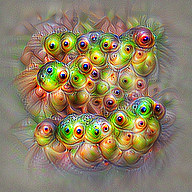
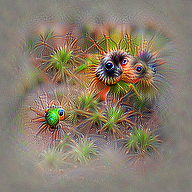
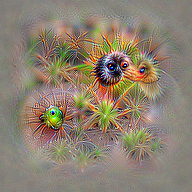

In [248]:
base_layer = "features_4"
diversity=10

@objectives.wrap_objective()
def ridge(layer):
    """Visualize a single channel"""
    def inner(model):
        return (model(layer) ** 2).mean()
    return inner

@objectives.wrap_objective()
def localized():
    """Visualize a single channel"""
    def inner(model):
        return ((model('input') - .5) ** 2).mean()
    return inner


layers_and_sizes = OrderedDict([("features_13", 64),
                                ("features_15", 64),
                                ("features_17", 64),
                                ("features_20", 64),
                                ("features_22", 64),
                                ("features_24", 64)])

result_str = ""
for layer, sz in layers_and_sizes.items():
  print(layer)
  result_str += f"<h1>{layer}</h1>"
  for draw in range(3):
    result_str += f"<h2>Sample {draw + 1}</h2>"
    # Selecting 10% of the channels to optimize generates more types of stimuli
    #subsel = np.random.rand(sz) < .1
    #
    # This set of settings works better for low-level layers
    
    batch_param_f = lambda: param.image(192, batch=4, channels=3, fft=True)
    if layer < 'features_17':
      #batch_param_f = lambda: param.image(192, batch=6, channels=3, fft=False)
      obj = localgroup_squared_delta(layer, base_layer, diversity=diversity, wx=15, wy=15) + 1e-3 * 3e5 * localized() + 1e3 * ridge('features_1')
      result = render.render_vis(model, obj, batch_param_f, show_inline=True, thresholds=(32,))
    else:  
      obj = localgroup_squared_delta(layer, base_layer, diversity=diversity, wx=15, wy=15) + 1e-3 * 3e4 * localized() + 1e3 * ridge('features_1')
      result = render.render_vis(model, obj, batch_param_f, show_inline=True, thresholds=(64,))

    #else:
    #  # This is better for high-level layers
    #  obj = localgroup_squared_delta(layer, base_layer, subsel, diversity=diversity)

    result_str += encode_result(result[0])

result_str += "Info about the model"
result_str += "<pre>" + repr(model) + "</pre>"


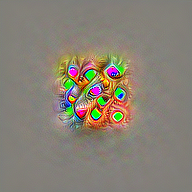
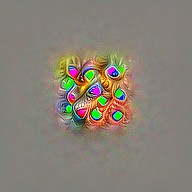
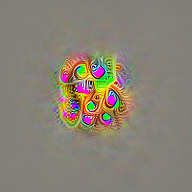
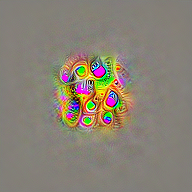
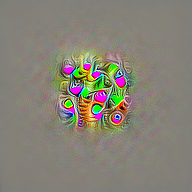
...
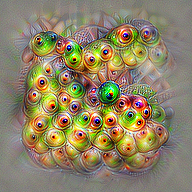
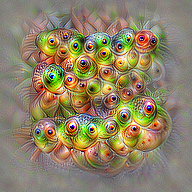
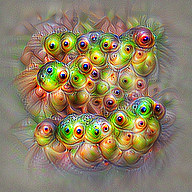
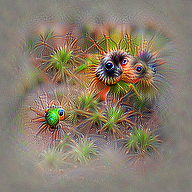
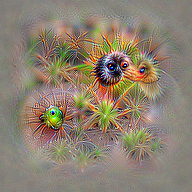

In [249]:
IPython.display.HTML(result_str)

In [24]:
results.shape

(256, 8, 8)

In [255]:
import pickle

@objectives.wrap_objective()
def weighted(layer, w):
    """ Linearly weighted channel activation around some spot as objective
    weight: a torch Tensor vector same length as channel. """
    def inner(model):
        layer_t = model(layer)
        # Interpolate weights to the size of layer_t
        W = F.interpolate(w, (layer_t.shape[-2], layer_t.shape[-1]))
        #W = torhc
        return -(layer_t * W).mean() / W.mean()
        #return -(layer_t).mean()

    return inner

@objectives.wrap_objective()
def unweighted(layer, w):
    """ Linearly weighted channel activation around some spot as objective
    weight: a torch Tensor vector same length as channel. """
    def inner(model):
        layer_t = model(layer)
        return -(layer_t).mean()

    return inner

with open('results/vgg19_v2_layer7_weights.pkl', 'rb') as f:
    wx = torch.tensor(pickle.load(f), device='cuda').unsqueeze(0)
    
batch_param_f = lambda: param.image(224, batch=1, channels=3, fft=True)
obj = weighted('features_15', wx) + 1 * ridge('features_0')
#obj = unweighted('features_13', wx) + 1 * ridge('features_0')
result = render.render_vis(model, obj, batch_param_f, show_inline=True, thresholds=(256,), transforms=[])

FileNotFoundError: [Errno 2] No such file or directory: 'results/vgg19_v2_layer7_weights.pkl'

100%|██████████| 128/128 [00:02<00:00, 44.92it/s]



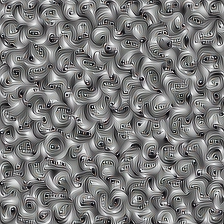

In [198]:
mask = np.zeros((1, 1, 8, 8))
mask[:, :, 2:6, 2:6] = 1
mask = torch.tensor(mask, device='cuda')

@objectives.wrap_objective()
def gray(layer):
    """ Linearly weighted channel activation around some spot as objective
    weight: a torch Tensor vector same length as channel. """
    def inner(model):
        layer_t = model(layer)
        return ((layer_t - layer_t.mean(axis=1, keepdims=True)) ** 2).mean()

    return inner

wfeat1 = ((wx * mask).sum(axis=3).sum(axis=2) / mask.sum())
wfeat2 = ((wx * (1-mask)).sum(axis=3).sum(axis=2) / (1-mask).sum())
#plt.plot(wfeat1, wfeat1-2*wfeat2, '.')

#+ 1e-2 * ridge('input')

batch_param_f = lambda: param.image(224, batch=1, channels=3, fft=True)
obj = weighted('features_17', (wfeat1 - wfeat2).reshape(1, -1, 1, 1)) + 1e4 * gray('input')
result = render.render_vis(model, obj, batch_param_f, show_inline=True, thresholds=(128,))

100%|██████████| 256/256 [00:13<00:00, 18.42it/s]



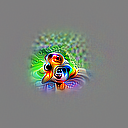
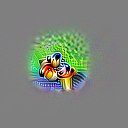
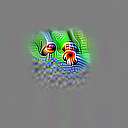
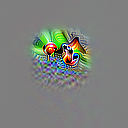

In [289]:
@objectives.wrap_objective()
def weighted_localgroup_squared_delta(layer, w, div_layer=None, wx=1, wy=1, subsel=None, diversity=0):
    """ Linearly weighted channel activation around some spot as objective
    weight: a torch Tensor vector same length as channel. """
    def inner(model):
        div = 0
        if diversity != 0:
            layer_t = model(layer)
            h1 = int(layer_t.shape[0] // 2)
            x = (layer_t.shape[3] + 1 - wx) // 2
            y = (layer_t.shape[2] + 1 - wy) // 2

            layer_ = layer_t[:h1, :, y:y + wy, x:x + wx]
            
                
            batch, channels, _, _ = layer_.shape

            flattened = layer_.reshape(batch, channels, -1)
            grams = torch.matmul(flattened, torch.transpose(flattened, 1, 2))
            grams = F.normalize(grams, p=2, dim=(1, 2))
            div = -diversity * sum([ sum([ (grams[i]*grams[j]).sum()
                                    for j in range(batch) if j != i])
                                    for i in range(batch)]) / batch

            layer_ = layer_t[h1:, :, y:y + wy, x:x + wx]

            batch, channels, _, _ = layer_.shape
            flattened = layer_.reshape(batch, channels, -1)
            grams = torch.matmul(flattened, torch.transpose(flattened, 1, 2))
            grams = F.normalize(grams, p=2, dim=(1, 2))
            div += -diversity * sum([ sum([ (grams[i]*grams[j]).sum()
                                    for j in range(batch) if j != i])
                                    for i in range(batch)]) / batch

            layer_t = model(layer)

            x = (layer_t.shape[3] + 1 - wx) // 2
            y = (layer_t.shape[2] + 1 - wy) // 2

        delta_activity = ((layer_t[:h1, :, y:y + wy, x:x + wx] - layer_t[h1:, :, y:y + wy, x:x + wx]).mean(0))
        projection = torch.matmul(w.T, delta_activity.reshape(-1, wx*wy))
        return -(projection ** 2).mean() + div
    return inner

with open('results/vgg19_raw_v4_layer7_weights.pkl', 'rb') as f:
    wx = torch.tensor(pickle.load(f), device='cuda').unsqueeze(0)

wx = wx.mean(3).mean(2).squeeze()
wx = wx / torch.sqrt((wx ** 2).mean())
wx = torch.ones(wx.shape, device='cuda')
#wx = torch.eye(wx.shape[0], device='cuda')
batch_param_f = lambda: param.image(128, batch=4, fft=True)

layer = 'features_17'
base_layer = 'features_1'
obj = weighted_localgroup_squared_delta(layer, wx, base_layer, diversity=diversity, wx=11, wy=11) + 3e7 * localized() + 1e3 * ridge('features_1')
result = render.render_vis(model, obj, batch_param_f, show_inline=True, thresholds=(256,))

In [260]:
wx.shape

torch.Size([1, 256, 8, 8, 866])